<a href="https://colab.research.google.com/github/ferryastika/EDA-01/blob/main/EDA-Covid19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Problem Statement:**

Bagaimana cara kita melakukan analisa data menggunakan API terbuka yang ada di Indonesia?

## Lakukan Eksekusi Library yang diperlukan

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import cufflinks as cf
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import plotly
import plotly.offline as py
import plotly.graph_objs as go
from plotly import graph_objects as go
import requests
import json, requests


## Melakukan Akses ke API Open Data Jawa Timur

### Apakah memerlukan akses/request?

Untuk melakukan akses ke API open data jawa timur maka perlu melakukan akses kedalam aplikasi di [Satu Data Jawa Timur](https://sata.jatimprov.go.id/). Pelatihan hari ini akan menggunakan data COVID-19 dikarenakan data yang disediakan dalam bentuk Time-Series agar dapat memberikan gambar lebih mengenai analisa data.

Untuk melakukan pengambilan data dapat dilihat melalui[Doc API Satu Data Jawa Timur](https://sata.jatimprov.go.id//service.php//dataset//option). Pada studi kasus kali ini akan mengambil data sebanyak 7500 data

In [2]:
data_sata = requests.get('https://sata.jatimprov.go.id/service.php/dataset/data-covid-19?limit=8300')\
                         .json()["result"]
data_sata

{'status': 200,
 'option': 'https://sata.jatimprov.go.id/service.php/dataset/option',
 'message': 'get data successful',
 'title': 'Data Covid 19',
 'description': 'https://covid19dev.jatimprov.go.id',
 'owner': 'other',
 'page': {'size': 8300, 'totalElements': 52592, 'totalPages': 7, 'number': 1},
 'data': [{'tanggal': '2021-01-31',
   'kabko': 'KOTA BATU',
   'suspect': '983',
   'probable': '69',
   'suspect_diisolasi': '104',
   'suspect_discarded': '887',
   'confirm': '1184',
   'confirm_bergejala': '0',
   'confirm_tanpa_gejala': '1184',
   'confirm_perjalanan': '0',
   'confirm_kontak': '0',
   'confirm_tanpa_riwayat': '1184',
   'confirm_selesai': '1059',
   'confirm_dilacak': '0',
   'kontak_baru': '0',
   'kontak_suspect': '0',
   'kontak_confirm': '0',
   'kontak_mangkir': '0',
   'kontak_discarded': '0',
   'meninggal_rtpcr': '97',
   'covidmeninggal_rtpcr': '97',
   'bkncovidmeninggal_rtpcr': '0',
   'meninggal_probable': '61',
   'spesimen_swab': '10821',
   'rapid': '0'

## Bentuk data API Jawa Timur

Bisa dilihat bahwa data yang disediakan dalam bentuk JavaScript Object Notation (JSON) sehingga perlu dilakukan normalisasi data dan dilakukan konversi kedalam bentuk data frame agar mudah untuk dilakukan analisa.

In [3]:
data_Covid = pd.json_normalize(data_sata['data'])
data_Covid

,tanggal,kabko,suspect,probable,suspect_diisolasi,suspect_discarded,confirm,confirm_bergejala,confirm_tanpa_gejala,confirm_perjalanan,...,reaktif_swab_plus,suspectprob_iso_rujukan,suspectprob_iso_darurat,suspectprob_iso_mandiri,konfirmasi_iso_rujukan,konfirmasi_iso_darurat,konfirmasi_iso_mandiri,suspectprob_iso_gedung,konfirmasi_iso_gedung,ke_iso_mandiri
0,2021-01-31,KOTA BATU,983,69,104,887,1184,0,1184,0,...,0,6,0,2,13,0,3,0,7,6
1,2021-01-31,KOTA PROBOLINGGO,3,27,3,1633,2000,1542,458,176,...,315,3,0,0,38,0,99,0,69,0
2,2021-01-31,KAB. SUMENEP,10,0,10,613,1623,732,891,89,...,1620,3,1,6,23,27,34,0,0,0
3,2021-01-31,KAB. NGAWI,65,2,44,234,1091,456,635,112,...,101,11,0,6,43,0,39,0,49,109
4,2021-01-31,KAB. MADIUN,14,1,14,340,1049,699,350,114,...,302,14,0,0,102,0,55,0,0,64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8295,2021-07-01,KOTA PROBOLINGGO,0,33,0,1787,2369,1732,637,221,...,481,0,0,0,23,0,97,0,24,0
8296,2021-07-01,KOTA MALANG,349,122,349,7143,7081,4896,2185,24,...,0,246,0,103,55,20,119,0,1,0
8297,2021-07-01,KOTA PASURUAN,2,9,2,184,1953,1053,900,0,...,0,0,0,0,12,0,54,0,4,13
8298,2021-07-01,KAB. MAGETAN,58,5,58,1032,4575,2730,1845,83,...,17,10,0,48,178,0,111,0,8,584


## Analisa dataframe

Pada bagian pojok kiri bawah terlihat terdapat 5000 data (row) dengan 37 feature (columns). Untuk lebih jelas mengenai isi dari feture maka dapat melakukan eksekusi menggunakan `"info()"` dan untuk melihat data sampel bisa menggunakan `"head()"`

In [4]:
data_Covid.info()
data_Covid.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8300 entries, 0 to 8299
Data columns (total 37 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   tanggal                  8300 non-null   object
 1   kabko                    8300 non-null   object
 2   suspect                  8300 non-null   object
 3   probable                 8300 non-null   object
 4   suspect_diisolasi        8300 non-null   object
 5   suspect_discarded        8300 non-null   object
 6   confirm                  8300 non-null   object
 7   confirm_bergejala        8300 non-null   object
 8   confirm_tanpa_gejala     8300 non-null   object
 9   confirm_perjalanan       8300 non-null   object
 10  confirm_kontak           8300 non-null   object
 11  confirm_tanpa_riwayat    8300 non-null   object
 12  confirm_selesai          8300 non-null   object
 13  confirm_dilacak          8300 non-null   object
 14  kontak_baru              8300 non-null  

,tanggal,kabko,suspect,probable,suspect_diisolasi,suspect_discarded,confirm,confirm_bergejala,confirm_tanpa_gejala,confirm_perjalanan,...,reaktif_swab_plus,suspectprob_iso_rujukan,suspectprob_iso_darurat,suspectprob_iso_mandiri,konfirmasi_iso_rujukan,konfirmasi_iso_darurat,konfirmasi_iso_mandiri,suspectprob_iso_gedung,konfirmasi_iso_gedung,ke_iso_mandiri
0,2021-01-31,KOTA BATU,983,69,104,887,1184,0,1184,0,...,0,6,0,2,13,0,3,0,7,6
1,2021-01-31,KOTA PROBOLINGGO,3,27,3,1633,2000,1542,458,176,...,315,3,0,0,38,0,99,0,69,0
2,2021-01-31,KAB. SUMENEP,10,0,10,613,1623,732,891,89,...,1620,3,1,6,23,27,34,0,0,0
3,2021-01-31,KAB. NGAWI,65,2,44,234,1091,456,635,112,...,101,11,0,6,43,0,39,0,49,109
4,2021-01-31,KAB. MADIUN,14,1,14,340,1049,699,350,114,...,302,14,0,0,102,0,55,0,0,64


## Memilih dan transformasi DataFrame

Pada bagian ini akan dilakukan pemilihan feature yang dilakukan proses dan dilakukan transformasi jenis variabel

In [5]:
columns = ['tanggal', 'kabko','suspect','confirm','kontak_baru','spesimen_swab','rapid']
data_Covid_tidy = pd.DataFrame(data_Covid, columns=columns)

In [6]:
data_Covid_tidy

,tanggal,kabko,suspect,confirm,kontak_baru,spesimen_swab,rapid
0,2021-01-31,KOTA BATU,983,1184,0,10821,0
1,2021-01-31,KOTA PROBOLINGGO,3,2000,1552,3675,19591
2,2021-01-31,KAB. SUMENEP,10,1623,0,2891,17500
3,2021-01-31,KAB. NGAWI,65,1091,601,1027,72569
4,2021-01-31,KAB. MADIUN,14,1049,3683,2593,13424
...,...,...,...,...,...,...,...
8295,2021-07-01,KOTA PROBOLINGGO,0,2369,1845,4612,20656
8296,2021-07-01,KOTA MALANG,349,7081,0,81330,7663
8297,2021-07-01,KOTA PASURUAN,2,1953,3532,5959,32525
8298,2021-07-01,KAB. MAGETAN,58,4575,12033,11658,21097


In [7]:
cols = ['suspect','confirm','kontak_baru','spesimen_swab','rapid']
data_Covid_tidy[cols] = data_Covid_tidy[cols].apply(pd.to_numeric, errors='coerce', axis=1)
data_Covid_tidy['tanggal'] = pd.to_datetime(data_Covid_tidy['tanggal'])
data_Covid_tidy = data_Covid_tidy.sort_values(by='tanggal')


In [8]:
data_Covid_tidy.info()
data_Covid_tidy.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8300 entries, 1197 to 7128
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   tanggal        8300 non-null   datetime64[ns]
 1   kabko          8300 non-null   object        
 2   suspect        8300 non-null   int64         
 3   confirm        8300 non-null   int64         
 4   kontak_baru    8300 non-null   int64         
 5   spesimen_swab  8300 non-null   int64         
 6   rapid          8300 non-null   int64         
dtypes: datetime64[ns](1), int64(5), object(1)
memory usage: 518.8+ KB


,tanggal,kabko,suspect,confirm,kontak_baru,spesimen_swab,rapid
1197,2021-01-01,KAB. BLITAR,14,1996,10601,15959,33655
1203,2021-01-01,KAB. MADIUN,28,395,2380,2070,13424
1201,2021-01-01,KAB. PONOROGO,46,1253,4053,3369,24510
1200,2021-01-01,KAB. MALANG,965,1497,0,8430,0
1199,2021-01-01,KAB. LAMONGAN,362,1760,3605,2640,36408


Jika data sudah ditransformasikan dalam bentuk date time dan integer maka data siap untuk dilakukan analisa.

## Pembagian data studi kasus

Pada data bisa dilihat terdapat feature bernama `"kabko"`. Silahkan bapak ibu sekalian merubah code dibawah berdasarakan kabupaten kota masing-masing dengan penulisan huruf abjad (Uppercase).

In [9]:
data_covid_surabaya = data_Covid_tidy.loc[data_Covid_tidy['kabko'] == 'KOTA SURABAYA']
data_covid_surabaya.head()

,tanggal,kabko,suspect,confirm,kontak_baru,spesimen_swab,rapid
1204,2021-01-01,KOTA SURABAYA,283,18205,395436,392749,260034
1171,2021-01-02,KOTA SURABAYA,279,18248,398876,395228,260147
1129,2021-01-03,KOTA SURABAYA,276,18288,401089,398800,260165
1093,2021-01-04,KOTA SURABAYA,288,18349,403539,402352,261881
1045,2021-01-05,KOTA SURABAYA,280,18399,408438,406830,261895


## **Saatnya melakukan analisa data** ##


## Fungsi describe()

dengan menggunakan fungsi describe kita dapat melihat deskripsi statistik dari data. Bisa dilihat deskripsi data yang disediakan sangat bervariasi

In [10]:
data_covid_surabaya.describe()


,suspect,confirm,kontak_baru,spesimen_swab,rapid
count,212.000000,212.000000,212.00000,2.120000e+02,212.000000
mean,94.306604,24183.773585,565199.34434,6.786762e+05,361063.033019
std,70.588826,6210.819345,107879.10083,1.587581e+05,66181.967234
min,21.000000,18205.000000,395436.00000,8.134000e+03,49476.000000
25%,47.000000,21138.250000,489933.75000,5.748195e+05,320819.250000
50%,67.500000,23223.500000,527129.50000,6.726040e+05,352653.500000
75%,112.000000,24281.500000,639693.25000,7.625258e+05,392196.500000
max,306.000000,52782.000000,853117.00000,1.053396e+06,497922.000000


<ipython-input-11-972c16c17e68>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

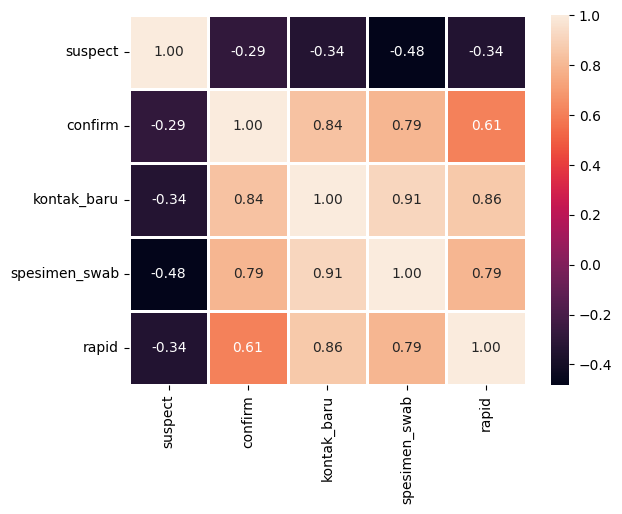

In [11]:
sns.heatmap(data_covid_surabaya.corr(), annot=True, fmt='.2f', linewidths=2)


## Visualisasi Data

Dengan menggunakan visualisasi data akan memudahkan pengguna dalam memahami karakteristik data

<Figure size 640x480 with 0 Axes>

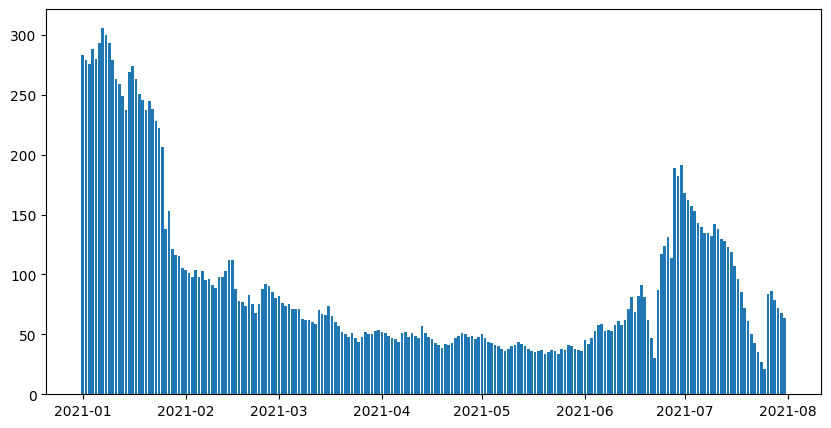

In [12]:
plt.clf()
fig, ax = plt.subplots(figsize=(10,5))
ax.bar(data=data_covid_surabaya, x='tanggal', height='suspect')
plt.show()

<Figure size 640x480 with 0 Axes>

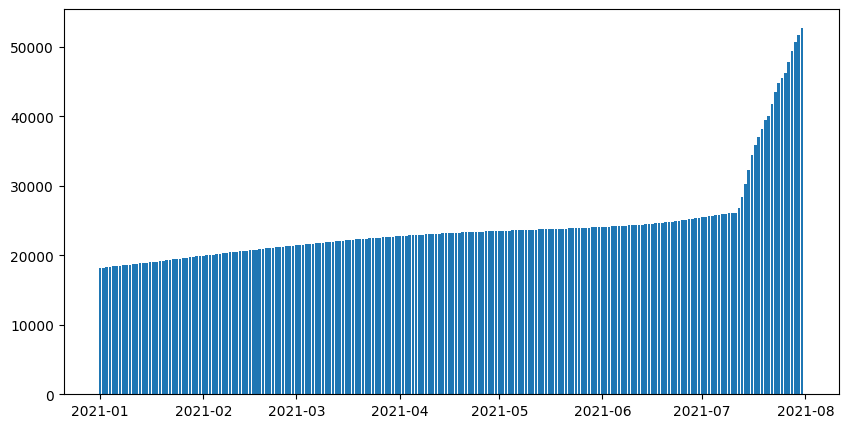

In [13]:
plt.clf()
fig, ax = plt.subplots(figsize=(10,5))
ax.bar(data=data_covid_surabaya, x='tanggal', height='confirm')
plt.show()

<Figure size 640x480 with 0 Axes>

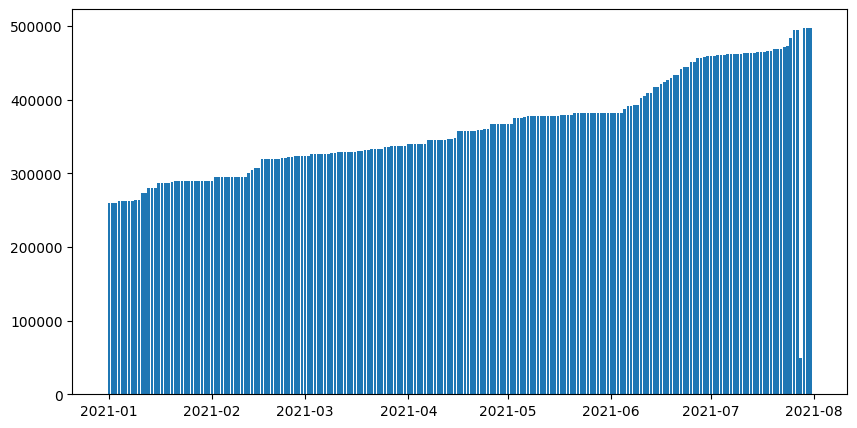

In [14]:
plt.clf()
fig, ax = plt.subplots(figsize=(10,5))
ax.bar(data=data_covid_surabaya, x='tanggal', height='rapid')
plt.show()

<Figure size 640x480 with 0 Axes>

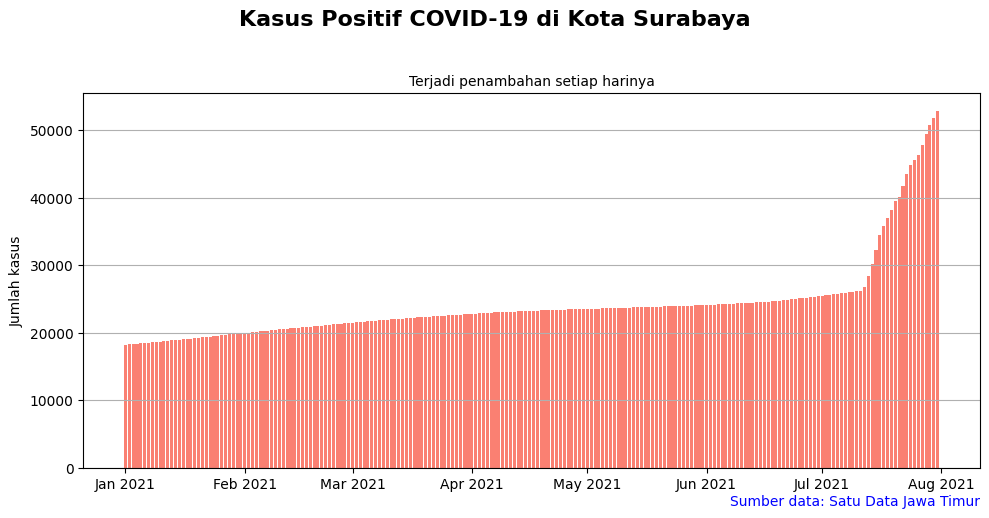

In [15]:
plt.clf()
fig, ax = plt.subplots(figsize=(10,5))
ax.bar(data=data_covid_surabaya, x='tanggal', height='confirm', color='salmon')
fig.suptitle('Kasus Positif COVID-19 di Kota Surabaya',
             y=1.03, fontsize=16, fontweight='bold', ha='center')
ax.set_title('Terjadi penambahan setiap harinya',
             fontsize=10)
ax.set_xlabel('')
ax.set_ylabel('Jumlah kasus')
ax.text(1, -0.1, 'Sumber data: Satu Data Jawa Timur', color='blue',
        ha='right', transform=ax.transAxes)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.grid(axis='y')
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

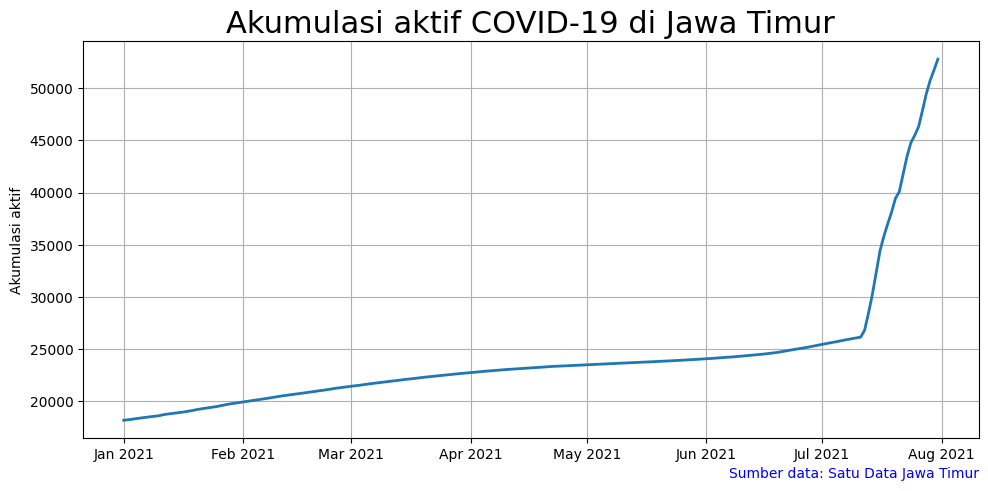

In [16]:
plt.clf()
fig, ax = plt.subplots(figsize=(10,5))
ax.plot('tanggal', 'confirm', data=data_covid_surabaya, lw=2)
ax.set_title('Akumulasi aktif COVID-19 di Jawa Timur',
             fontsize=22)
ax.set_xlabel('')
ax.set_ylabel('Akumulasi aktif')
ax.text(1, -0.1, 'Sumber data: Satu Data Jawa Timur', color='blue',
        ha='right', transform=ax.transAxes)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.grid()
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

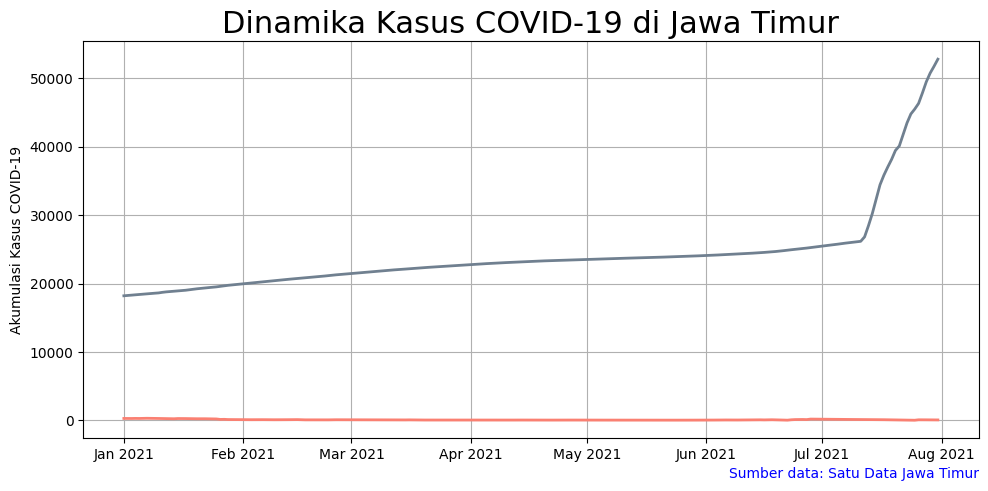

In [17]:
plt.clf()
fig, ax = plt.subplots(figsize=(10,5))
ax.plot('tanggal', 'suspect', data=data_covid_surabaya, lw=2, color='salmon')
ax.plot('tanggal', 'confirm', data=data_covid_surabaya, lw=2, color='slategrey')
#ax.plot('tanggal', 'kontak_baru', data=data_covid_surabaya, lw=2, color='olivedrab')
ax.set_title('Dinamika Kasus COVID-19 di Jawa Timur', fontsize=22)
ax.set_xlabel('')
ax.set_ylabel('Akumulasi Kasus COVID-19')
ax.text(1, -0.1, 'Sumber data: Satu Data Jawa Timur', color='blue',
        ha='right', transform=ax.transAxes)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.grid()
plt.tight_layout()
plt.show()

## **Kesimpulan** ##

Dilihat dari bagan diatas antara kasus suspect dan konfirm bisa diketahui bahwa ada peningkatan kasus signifikan konfirmasi COVID-19 diakhir bulan Juli yang mengindikasikan bahwa perlu adanya tindak lanjut untuk mitigasi penyebaran COVID-19 serta peningkatan pengawasan pemerintah guna menekan kasus yang terjadi.

## Visualisasi Data Spasial

Pada kasus selanjutnya yaitu melakukan visualisasi data menggunakan data spasial, untuk kasus yang digunakan menggunakan data dari [data.go.id](https://data.go.id/home). Data kali ini mengenai data penduduk laki-laki dan perempuan di Jawa Timur.

In [18]:
url = "https://katalog.data.go.id/api/3/action/datastore_search?resource_id=f5cec758-d3ac-454f-8b74-719a5bf72be2&limit=350"
data_penduduk = requests.get(url).json()
data_penduduk

{'help': 'https://katalog.data.go.id/api/3/action/help_show?name=datastore_search',
 'error': {'__type': 'Not Found Error', 'message': 'Not found'},
 'success': False}

In [19]:
data_penduduk = pd.json_normalize(data_penduduk['result']['records'])

KeyError: 'result'

In [ ]:
data_penduduk

In [24]:
#Jika server data.go.id DOWN

# Load online dataset
online_dataset_path = 'https://raw.githubusercontent.com/praswibowo/EDA_API/main/f5cec758-d3ac-454f-8b74-719a5bf72be2.csv'
data_penduduk = pd.read_csv(online_dataset_path, sep=',')

# Displaying result
data_penduduk.head()

,_id,kabupaten_kota,jumlah_penduduk_laki__laki,jumlah_penduduk_perempuan,periode_update
0,1,Pacitan,299789,297791,Semester I 2021
1,2,Ponorogo,483130,485551,Semester I 2021
2,3,Trenggalek,375755,370979,Semester I 2021
3,4,Tulungagung,565882,560797,Semester I 2021
4,5,Blitar,618827,609465,Semester I 2021


## Pemilihan dan Transformasi Data
Untuk memudahkan proses visualisasi maka silahkan memilih data Semester yang diinginkan, untuk kasus kali ini menggunakan data Semester I 2021.

In [25]:
data_penduduk_fix = data_penduduk.loc[data_penduduk['periode_update'] == 'Semester I 2021']

In [29]:
data_penduduk_fix = data_penduduk_fix.apply(lambda x: x.astype(str).str.upper())

In [27]:
print(data_penduduk_fix.info())
data_penduduk_fix.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38 entries, 0 to 37
Data columns (total 6 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   _id                         38 non-null     int64 
 1   kabupaten_kota              38 non-null     object
 2   jumlah_penduduk_laki__laki  38 non-null     int64 
 3   jumlah_penduduk_perempuan   38 non-null     int64 
 4   periode_update              38 non-null     object
 5   jumlah_penduduk             38 non-null     int64 
dtypes: int64(4), object(2)
memory usage: 2.1+ KB
None


,_id,kabupaten_kota,jumlah_penduduk_laki__laki,jumlah_penduduk_perempuan,periode_update,jumlah_penduduk
0,1,Pacitan,299789,297791,Semester I 2021,597580
1,2,Ponorogo,483130,485551,Semester I 2021,968681
2,3,Trenggalek,375755,370979,Semester I 2021,746734
3,4,Tulungagung,565882,560797,Semester I 2021,1126679
4,5,Blitar,618827,609465,Semester I 2021,1228292


Selanjutnya dilakukan penjumlahan dengan laki-laki dan perempuan untuk mengetahui jumlah penduduk saat ini

In [26]:
data_penduduk_fix['jumlah_penduduk_laki__laki'] = data_penduduk_fix['jumlah_penduduk_laki__laki'].astype(str).astype(int)
data_penduduk_fix['jumlah_penduduk_perempuan'] = data_penduduk_fix['jumlah_penduduk_perempuan'].astype(str).astype(int)

#specify the columns to sum
cols = ['jumlah_penduduk_laki__laki', 'jumlah_penduduk_perempuan']

#define new column that contains sum of specific columns
data_penduduk_fix['jumlah_penduduk'] = data_penduduk_fix[cols].sum(axis=1)

In [30]:
print(data_penduduk_fix.info())
data_penduduk_fix.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38 entries, 0 to 37
Data columns (total 6 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   _id                         38 non-null     object
 1   kabupaten_kota              38 non-null     object
 2   jumlah_penduduk_laki__laki  38 non-null     object
 3   jumlah_penduduk_perempuan   38 non-null     object
 4   periode_update              38 non-null     object
 5   jumlah_penduduk             38 non-null     object
dtypes: object(6)
memory usage: 2.1+ KB
None


,_id,kabupaten_kota,jumlah_penduduk_laki__laki,jumlah_penduduk_perempuan,periode_update,jumlah_penduduk
0,1,PACITAN,299789,297791,SEMESTER I 2021,597580
1,2,PONOROGO,483130,485551,SEMESTER I 2021,968681
2,3,TRENGGALEK,375755,370979,SEMESTER I 2021,746734
3,4,TULUNGAGUNG,565882,560797,SEMESTER I 2021,1126679
4,5,BLITAR,618827,609465,SEMESTER I 2021,1228292


In [31]:
data_penduduk_fix.describe()

,_id,kabupaten_kota,jumlah_penduduk_laki__laki,jumlah_penduduk_perempuan,periode_update,jumlah_penduduk
count,38,38,38,38,38,38
unique,38,38,38,38,1,38
top,1,PACITAN,299789,297791,SEMESTER I 2021,597580
freq,1,1,1,1,38,1


## Load data Geojson
Geojson adalah format file yang berisi data vektor untuk melakukan visualisasi data spasial. file ini sangat penting untuk dilinkkan antara data vektor dengan data tabular agar dapat divisualisasikan

In [32]:
#Import modules for acquiring geojson
from urllib.request import urlopen
import json

#Import geojson from Github
with urlopen('https://raw.githubusercontent.com/praswibowo/EDA_API/main/KabKota_Jatim_FixRev3.geojson') as response:
    geo_jatim = json.load(response)  #Collect geojson data from Github


In [21]:
geo_jatim

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'KABUPATEN': 'BANGKALAN', 'BPS_CODE': '26'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[113.03427114099856, -6.879606492999905],
       [113.0343855839985, -6.879669432999959],
       [113.0346526249985, -6.879640344999957],
       [113.03493489899859, -6.879608910999922],
       [113.03533925599854, -6.879627480999959],
       [113.03561391299854, -6.879661815999958],
       [113.03590385199853, -6.879643245999921],
       [113.03632344299851, -6.879746710999942],
       [113.03654468699854, -6.879821087999896],
       [113.0365980999986, -6.879832524999961],
       [113.03677357199848, -6.879648951999867],
       [113.03705586999847, -6.879629873999884],
       [113.03743732899851, -6.879738102999847],
       [113.03797138699854, -6.879867342999901],
       [113.03841389899846, -6.879928855999927],
       [113.03866565899841, -6.879736675999929],
       [113.03883351399854, -6.879621

In [33]:
#Import libraries

for col in data_penduduk_fix.columns:
    data_penduduk_fix[col] = data_penduduk_fix[col].astype(str)

data_penduduk_fix['text'] = data_penduduk_fix['kabupaten_kota'] + '<br>' + \
    'Laki-Laki ' + data_penduduk_fix['jumlah_penduduk_laki__laki'] + '<br>' + \
    'Perempuan ' + data_penduduk_fix['jumlah_penduduk_perempuan']

#Create figure object
fig = go.Figure(
    go.Choroplethmapbox(
        geojson = geo_jatim, #Assign geojson file
        featureidkey = "properties.KABUPATEN", #Assign feature key
        locations = data_penduduk_fix["kabupaten_kota"], #Assign location data
        z = data_penduduk_fix["jumlah_penduduk"].astype(int), #Assign information data
        text=data_penduduk_fix['text'], # hover text
        zauto = True,
        colorscale = 'RdYlGn',
        reversescale = True,
        marker_line_color='white', # line markers between states
        showscale = True,
        colorbar_title="Jumlah Penduduk"
    )
)


#Update layout
fig.update_layout(
    title_text='Jumlah Penduduk Jawa Timur',
    mapbox_style = "carto-positron", #Decide a style for the map
    mapbox_zoom = 6, #Zoom in scale
    mapbox_center = {"lat": -7.432, "lon": 112.630}, #Center location of the map
)

## **Kesimpulan** ##

dengan menggunakan visualisasi data spasial dapat memudahkan dalam menganalisa data. Bisa dilihat bahwa daerah padat penduduk terdapat di Kota Surabaya, Kabupaten Malang da Kabupaten Jember. Dengan pendekatan analisa spasial ini akan memudahkan stakeholder dalam memberikan kebijakan yang berdampak tinggi ke masyarakat.